# Import Libraries and Load In Data

In [31]:
from PIL import Image, ImageOps
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
import os, shutil
import time
import scipy
from scipy import ndimage
from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
import cv2

# Normal Example X-Ray

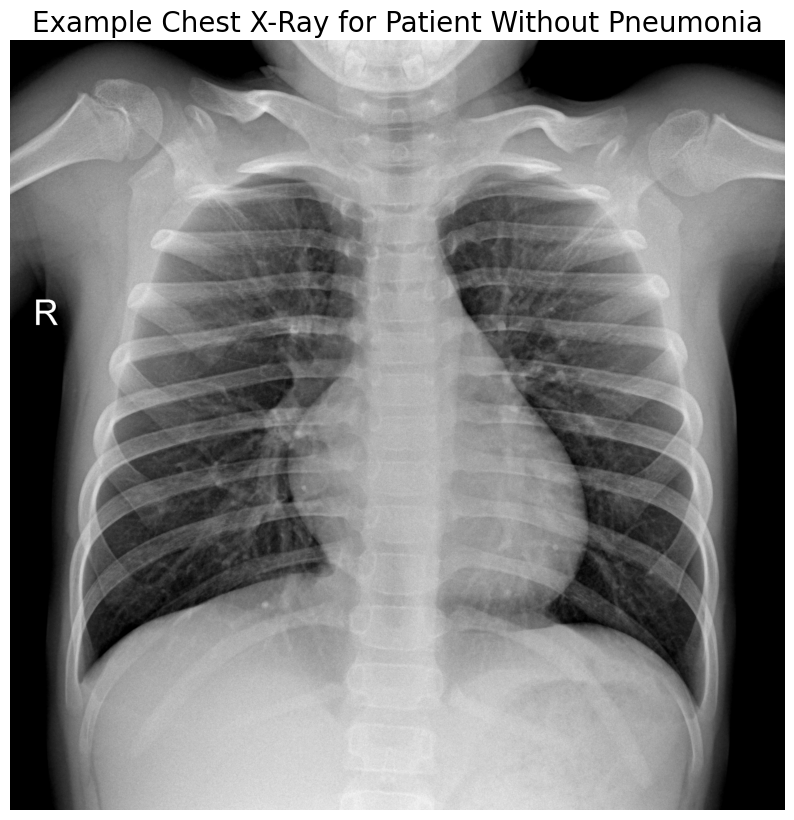

In [84]:


example = Image.open("CellData/chest_xray/train/NORMAL/NORMAL-28501-0001.jpeg")
example_grayscale = ImageOps.grayscale(example)

plt.figure(figsize=(10,10))
plt.imshow(example_grayscale, cmap='gray')
plt.title('Example Chest X-Ray for Patient Without Pneumonia', fontsize=20)
plt.axis('off')  
plt.show()


# Bacteria Example X-Ray

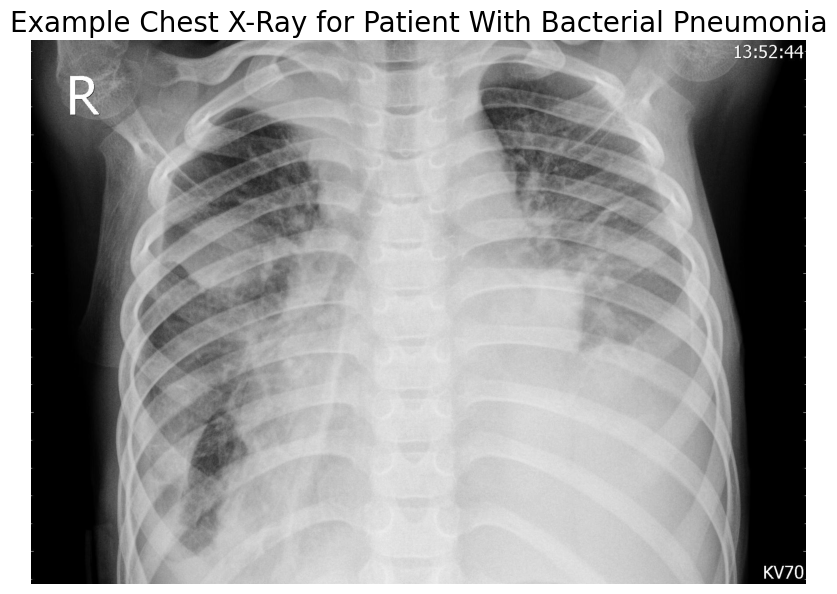

In [85]:
example2 = Image.open("CellData/chest_xray/train/PNEUMONIA/BACTERIA-37006-0001.jpeg")
example2_grayscale = ImageOps.grayscale(example2)
plt.figure(figsize=(10,10))
plt.imshow(example2_grayscale, cmap='gray')
plt.title('Example Chest X-Ray for Patient With Bacterial Pneumonia', fontsize=20)
plt.axis('off')  
plt.show()

# Virus Example X-Ray

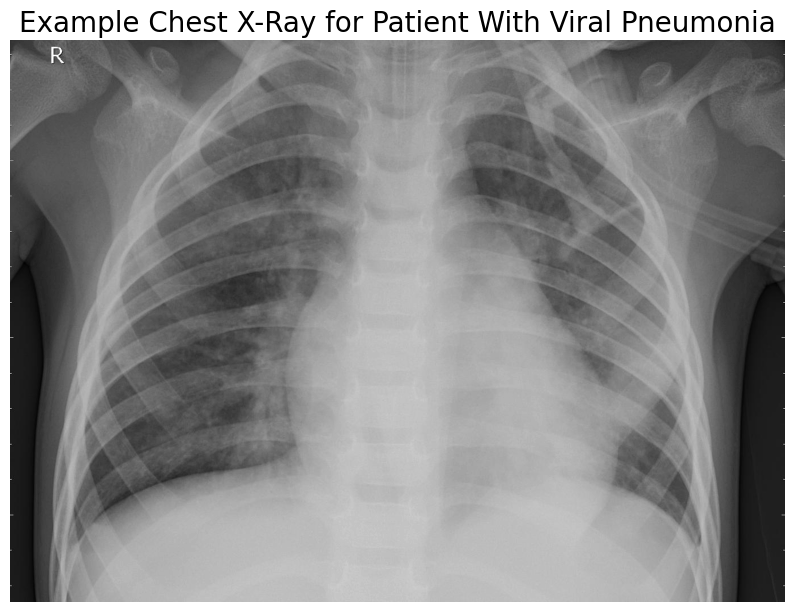

In [86]:
example3 = Image.open("CellData/chest_xray/train/PNEUMONIA/VIRUS-2426822-0008.jpeg")
example3_grayscale = ImageOps.grayscale(example3)
plt.figure(figsize=(10,10))
plt.imshow(example3_grayscale, cmap='gray')
plt.title('Example Chest X-Ray for Patient With Viral Pneumonia', fontsize=20)
plt.axis('off')  
plt.show()

# Looking at our data more in depth

In [25]:
folders = [
    "CellData/chest_xray/train/NORMAL", "CellData/chest_xray/test/NORMAL", "CellData/chest_xray/val/NORMAL",
    "CellData/chest_xray/train/PNEUMONIA", "CellData/chest_xray/test/PNEUMONIA", "CellData/chest_xray/val/PNEUMONIA"
]
for folder in folders:
    img_count = [file for file in os.listdir(folder) if file.endswith('.jpeg')]
    print('There are', len(img_count), 'images in', folder)
    
# dataset is imbalanced; there is more PNEUMONIA images than there are NORMAL

There are 1107 images in CellData/chest_xray/train/NORMAL
There are 238 images in CellData/chest_xray/test/NORMAL
There are 238 images in CellData/chest_xray/val/NORMAL
There are 2991 images in CellData/chest_xray/train/PNEUMONIA
There are 641 images in CellData/chest_xray/test/PNEUMONIA
There are 641 images in CellData/chest_xray/val/PNEUMONIA


In [49]:
#function to see the variance in size of the images
def check_image_sizes(folder):
    img_files = [img_file for img_file in os.listdir(folder) if img_file.endswith('.jpeg')]
    sizes = []
    for img_file in img_files:
        img_path = os.path.join(folder, img_file)
        img = Image.open(img_path)
        sizes.append(img.size)  # note: PIL uses (width, height) instead of (height, width)
    return sizes

In [50]:
normal_sizes = check_image_sizes('CellData/chest_xray/train/NORMAL')
print('Normal sizes:', set(normal_sizes))

Normal sizes: {(2071, 1296), (1724, 1588), (1296, 1052), (1430, 1141), (1762, 1224), (1994, 1839), (1616, 1408), (1744, 1337), (1716, 1504), (2348, 1851), (1470, 1043), (1318, 1067), (1762, 1480), (1630, 1333), (1372, 1047), (2001, 1725), (1600, 1329), (1778, 1168), (1434, 1260), (1642, 1545), (1676, 1129), (1733, 1044), (1638, 1264), (1786, 1437), (1744, 1422), (1766, 1468), (1624, 1375), (1846, 1488), (1845, 1761), (1360, 1167), (1172, 967), (1388, 1009), (1916, 2059), (1538, 1353), (1434, 1125), (1790, 1654), (1754, 1341), (2022, 1384), (1056, 792), (1458, 1190), (1862, 1441), (1720, 1348), (1558, 1048), (1700, 1379), (2134, 2376), (1400, 1239), (1608, 1125), (2446, 2224), (1542, 1341), (1902, 1495), (1716, 1225), (1752, 1160), (1850, 1314), (1754, 1615), (1690, 1334), (1742, 1372), (1654, 1259), (1608, 1152), (2234, 1843), (2572, 2476), (1442, 1101), (1284, 893), (1708, 1248), (1504, 1171), (1890, 1615), (1803, 1238), (1728, 1333), (1546, 1414), (1928, 1754), (1526, 1356), (1956, 1

In [69]:
pneumonia_sizes = check_image_sizes('CellData/chest_xray/train/PNEUMONIA')
print('PNEUMONIA sizes:', set(pneumonia_sizes))

PNEUMONIA sizes: {(976, 544), (848, 624), (1416, 816), (880, 576), (1794, 1176), (1592, 1041), (1856, 1496), (1364, 805), (1016, 616), (1328, 968), (1400, 1136), (920, 648), (1408, 960), (872, 608), (1360, 920), (1232, 1000), (796, 469), (888, 552), (840, 512), (792, 584), (2096, 1864), (1256, 984), (928, 624), (812, 678), (2000, 1896), (760, 488), (1272, 928), (1224, 888), (1736, 1328), (1176, 960), (1256, 840), (928, 480), (832, 512), (1400, 704), (982, 573), (1200, 1024), (1256, 696), (1128, 776), (1312, 856), (1624, 1208), (2126, 1226), (1248, 728), (492, 156), (1126, 851), (1152, 760), (1312, 712), (1184, 792), (1264, 672), (1010, 676), (1056, 643), (1208, 920), (1136, 752), (1216, 744), (1168, 704), (1552, 1224), (1304, 744), (1664, 1136), (428, 256), (1450, 947), (1202, 882), (2048, 1656), (1208, 776), (1160, 736), (1168, 560), (1686, 1160), (1192, 688), (1552, 1080), (1496, 1179), (1597, 1231), (1464, 967), (1276, 767), (1688, 1120), (1048, 680), (1560, 1200), (1080, 712), (161

In [51]:
#function to see many images at once
def plot_images(folder, num_imgs):
    img_files = os.listdir(folder)[:num_imgs]
    for file in img_files:
        img_path = os.path.join(folder, file)
        img = Image.open(img_path)
        plt.figure()
        plt.imshow(img, cmap='gray')
        plt.title(file)
        plt.axis('off')
        plt.show()

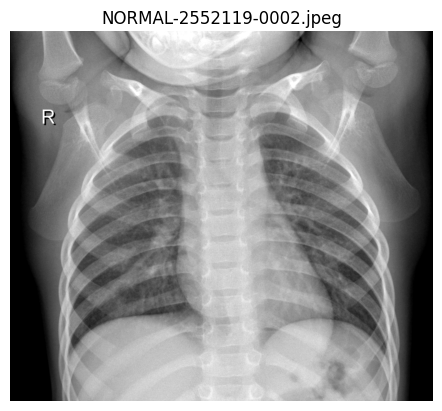

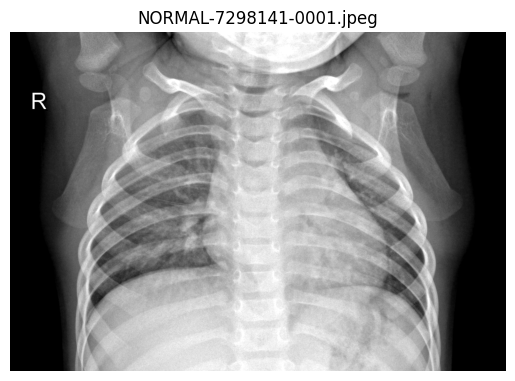

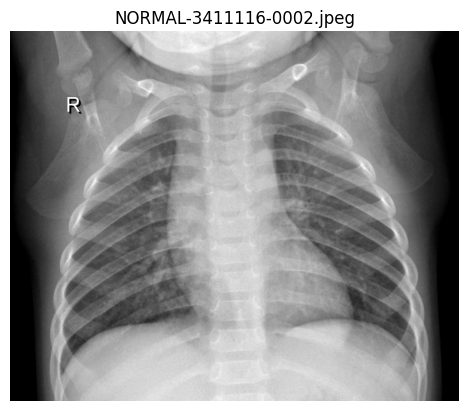

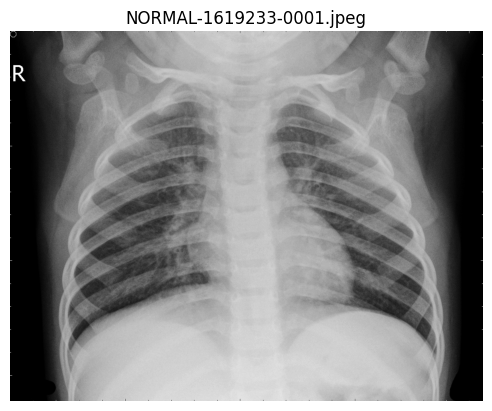

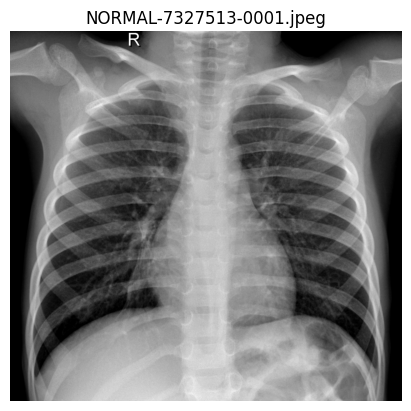

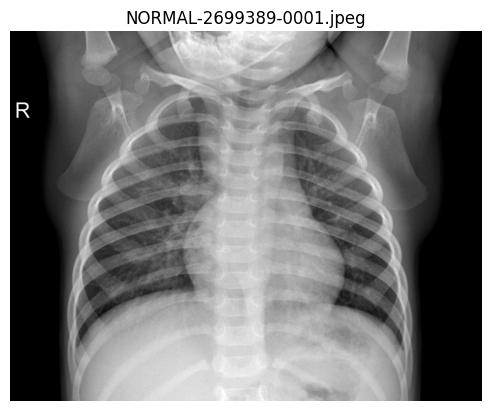

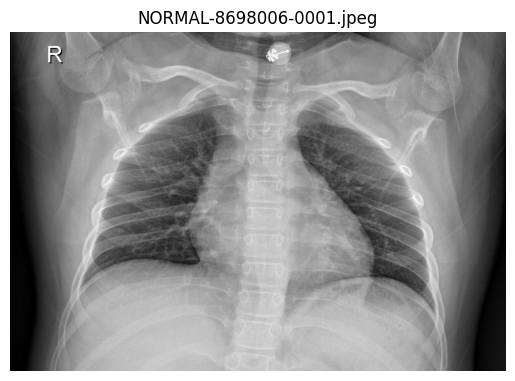

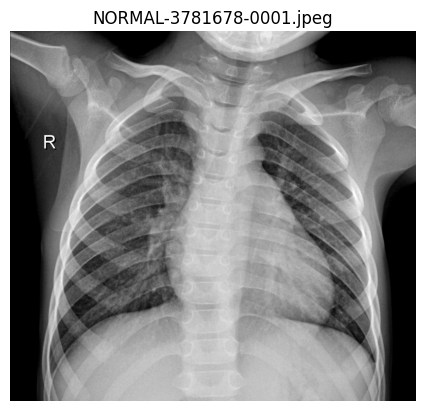

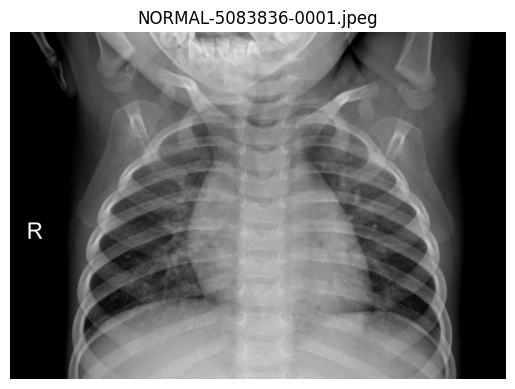

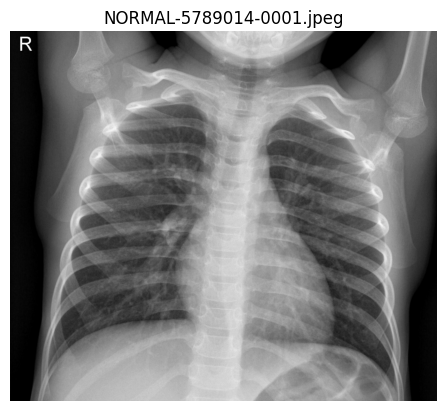

In [52]:
plot_images('CellData/chest_xray/train/NORMAL', 10)

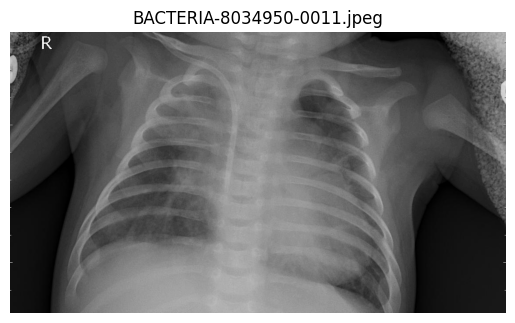

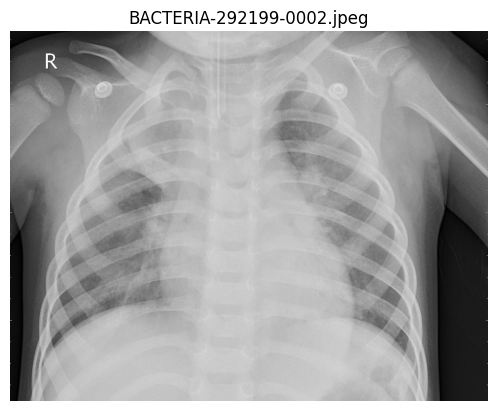

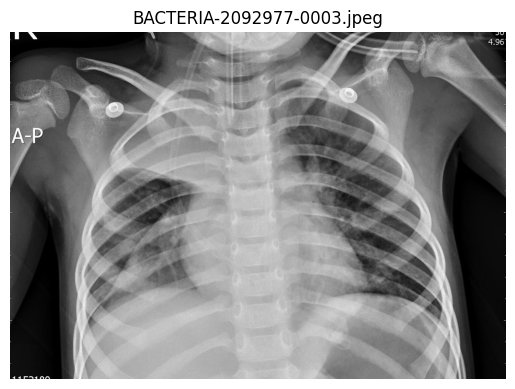

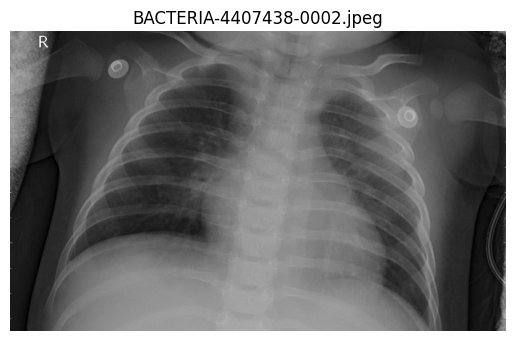

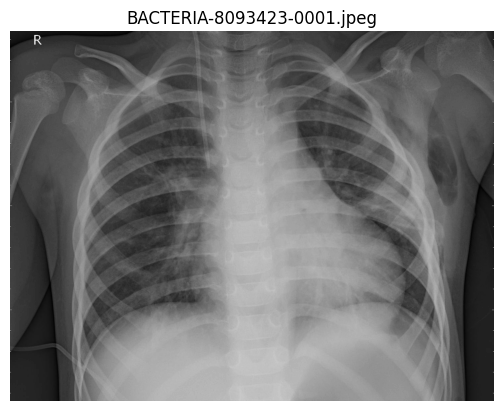

...

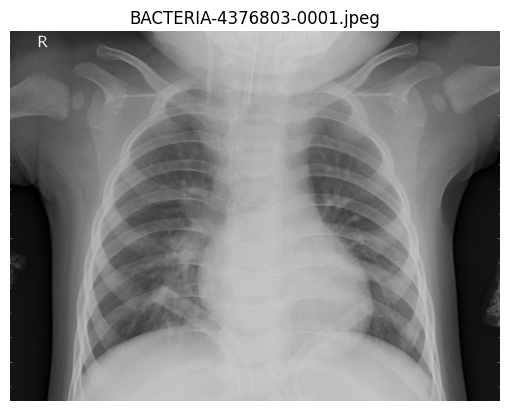

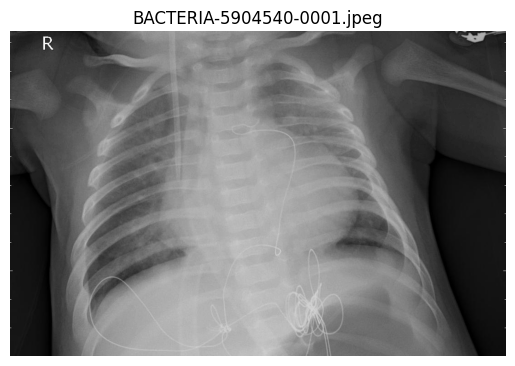

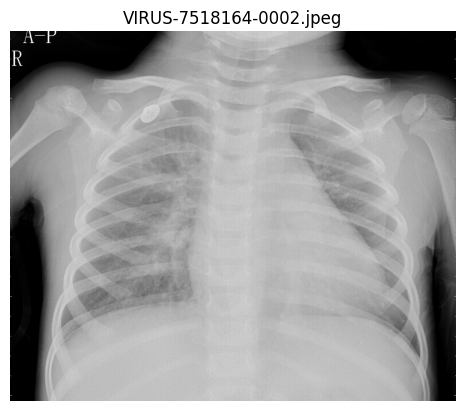

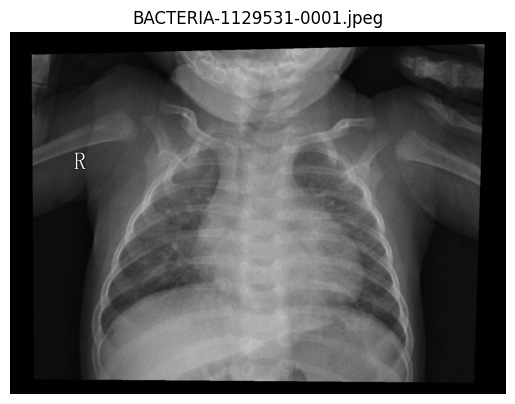

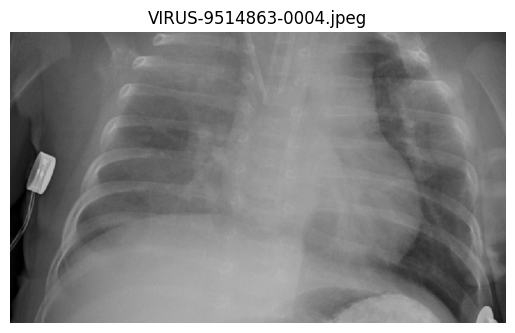

In [87]:
plot_images('CellData/chest_xray/train/PNEUMONIA', 50)

In [67]:
def plot_intensity_distribution(folder, num_imgs):
    img_files = os.listdir(folder)[:num_imgs]
    for img_file in img_files:
        img_path = os.path.join(folder, img_file)
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        plt.figure()
        plt.hist(img.ravel(), bins=256, color='gray')
        plt.title(f'Intensity Distribution: {img_file}')
        plt.show()

# how this code works:
# uses a for loop to iterate over each image in a folder
# for each image, it creates a variable for the path to the image
# this will show a histogram of pixel intensity
# so a large spike at 0 will correspond to more diffuse darkness in the image

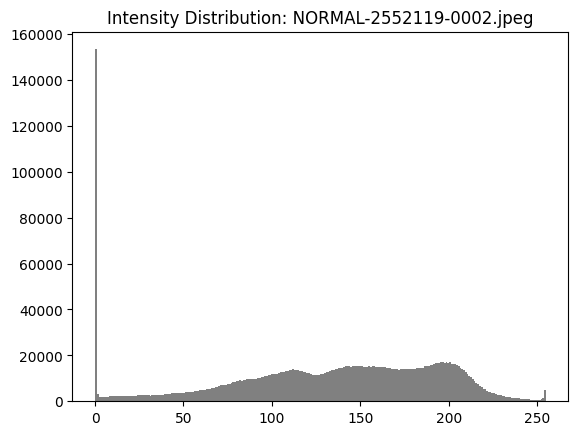

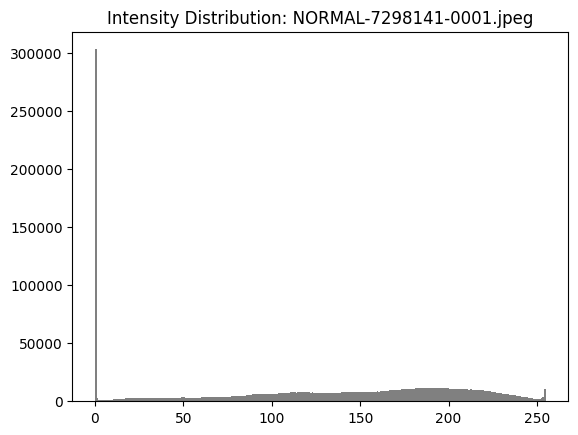

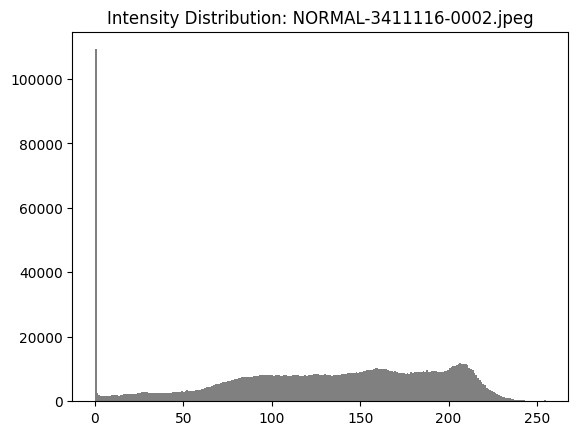

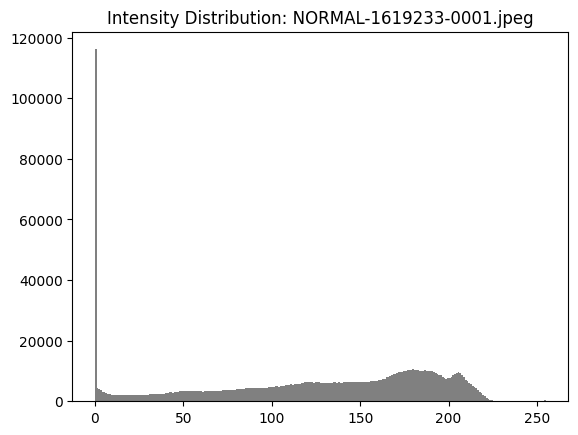

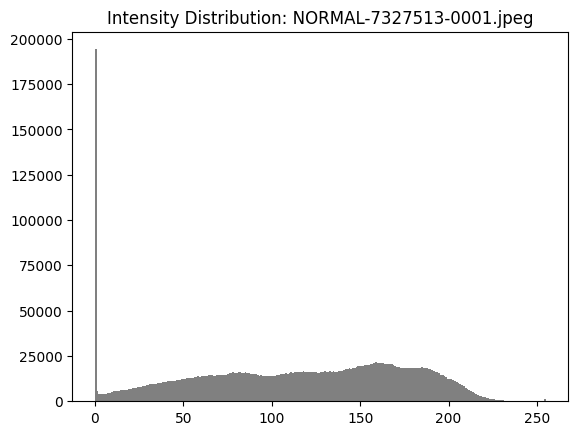

...

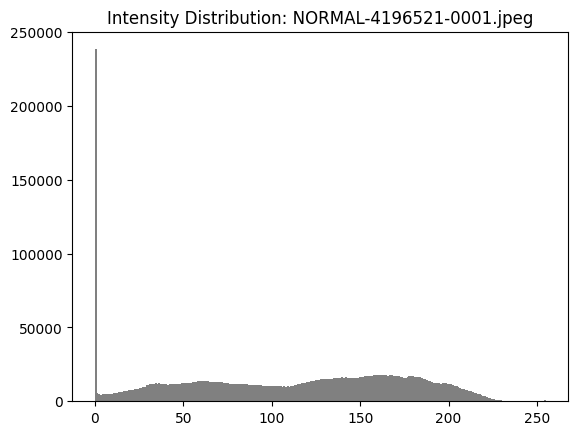

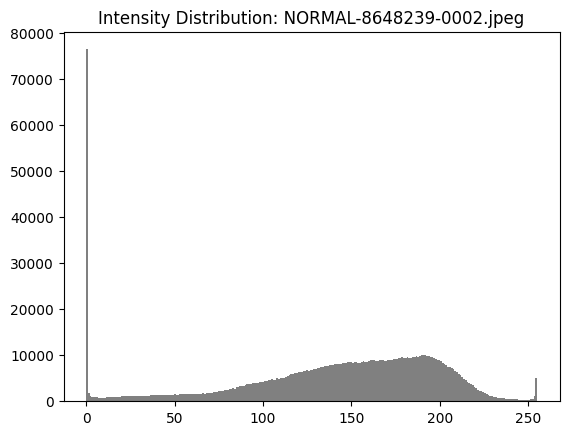

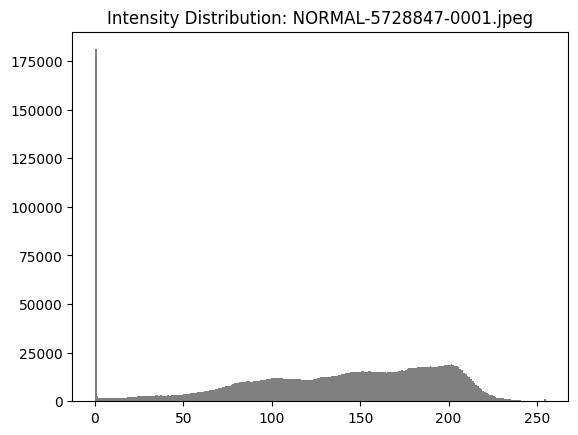

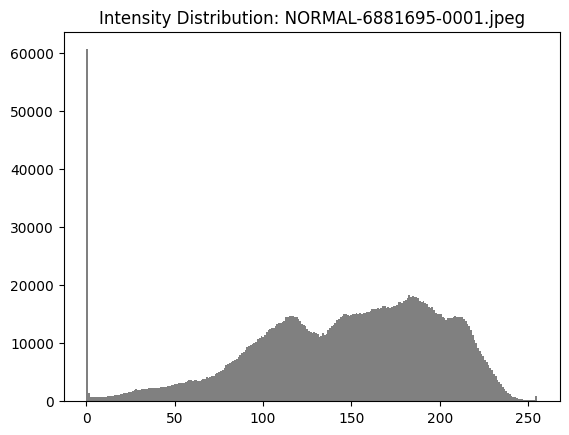

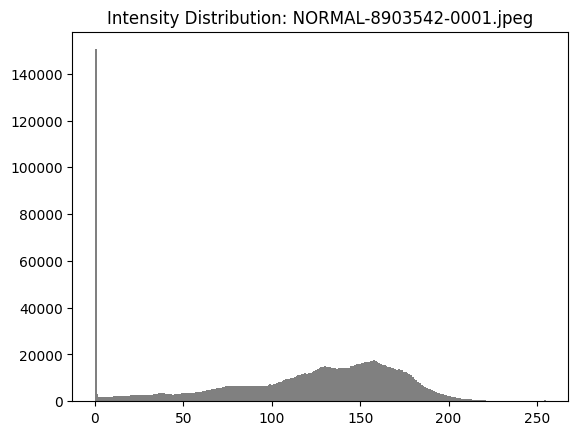

In [64]:
plot_intensity_distribution('CellData/chest_xray/train/NORMAL', 15)
# seems to be large spikes at 0 for a lot of these

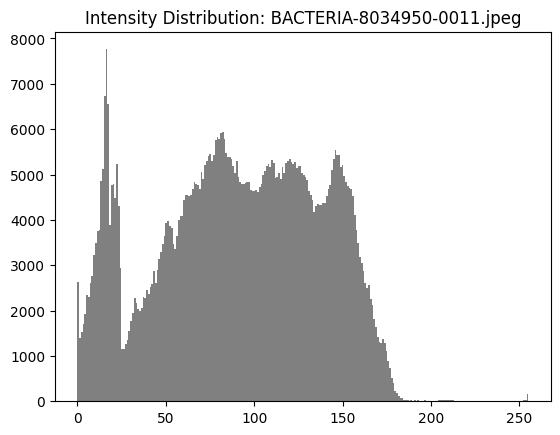

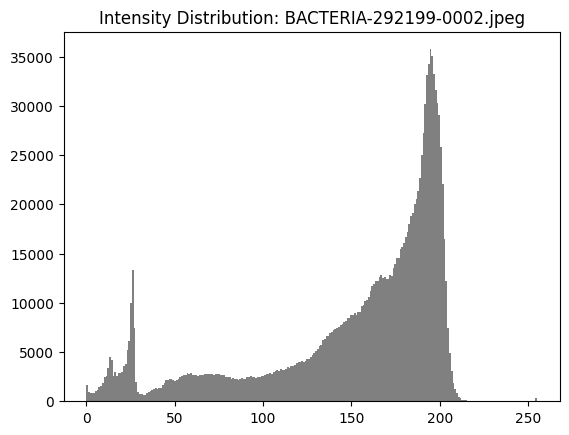

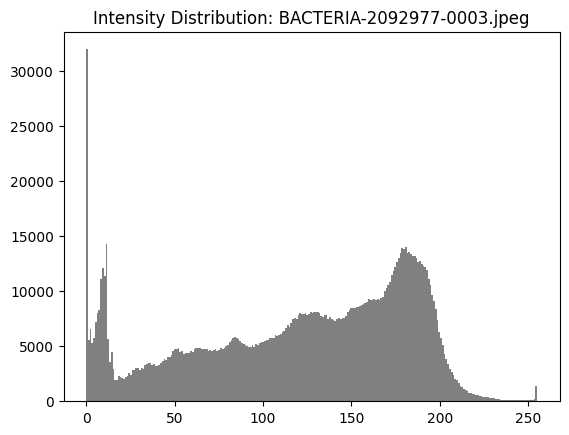

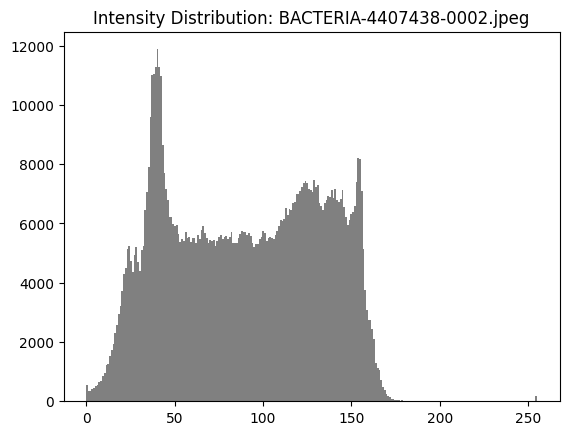

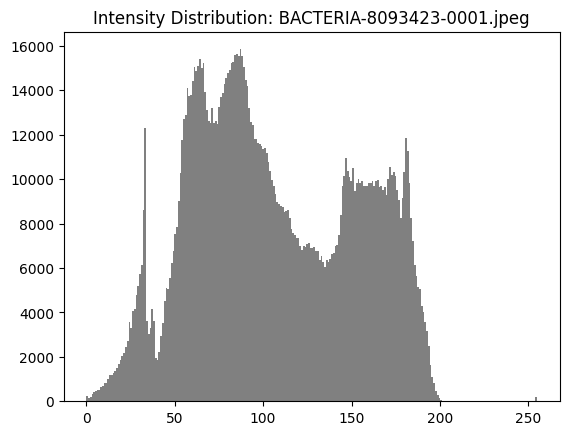

...

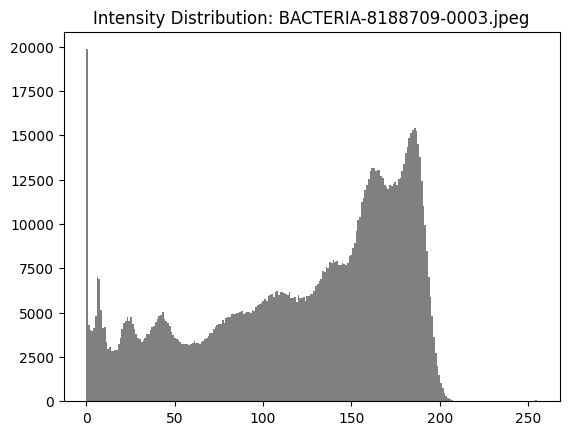

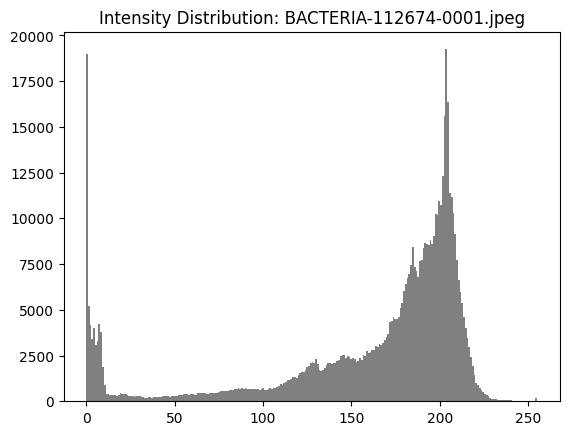

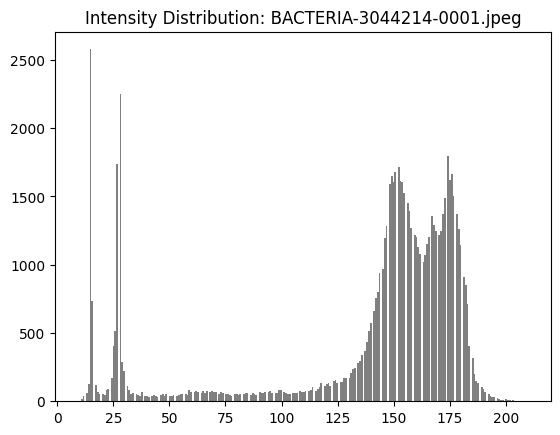

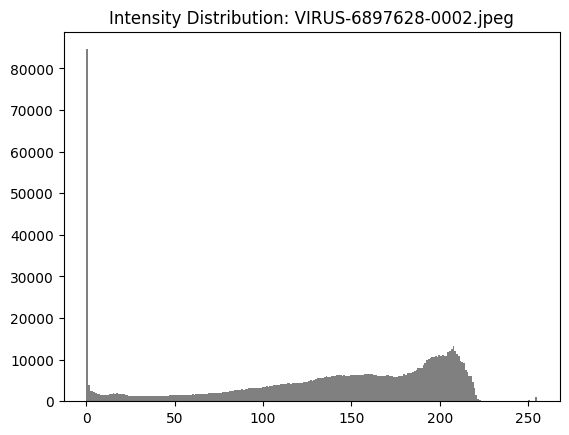

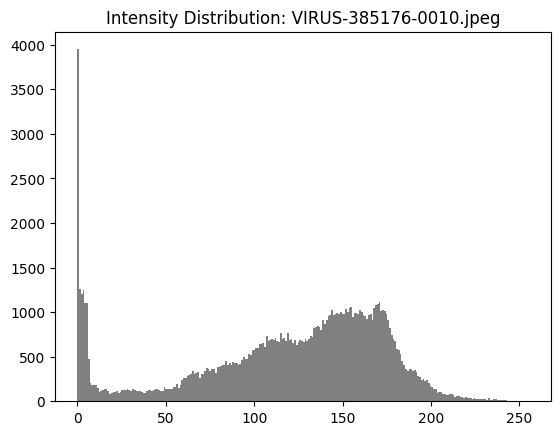

In [65]:
plot_intensity_distribution('CellData/chest_xray/train/PNEUMONIA', 15)
# less large spikes at 0, more diffuse signal across the image

# Takeaways from some of this EDA:

- the dataset is imbalanced; there are more pneumonia images than there are normal images. Will likely resolve this using a weighted loss function.
- the images have a high variance in size. This needs to be resolved via a resizing technique via ImageDataGenerator or another method
- there is a noticable trend in the pixel intensity histograms where there seems to be higher spikes at 0 (dark/black pixels) for the NORMAL group